In [186]:
import geopandas as gpd
from highcharts_core import highcharts
import folium
import matplotlib.pyplot as plt
import pandas as pd
import contextily as cx
import numpy as np
from folium import plugins
import matplotlib.lines as mlines
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset
from sklearn import preprocessing


In [187]:
df_67 = gpd.read_file("data/67/D67_RPG2022_niv1.shp", engine="pyogrio")
df_68 = gpd.read_file("data/68/D68_RPG2022_niv1.shp", engine="pyogrio")
df = gpd.GeoDataFrame(pd.concat([df_67, df_68]))

In [188]:
df

,NUM_ILOT,NUM_PARCEL,CODE_CULTU,SURF_ADM,BIO,MARAICHAGE,AGROFOREST,geometry
0,11,1,PPH,15.63,1,0,None,"POLYGON ((1004321.807 6813947.237, 1004316.122..."
1,11,1,PPH,0.97,0,0,None,"POLYGON ((1004311.338 6822217.053, 1004348.380..."
2,16,56,BTH,1.90,0,0,None,"POLYGON ((1004227.240 6869838.308, 1004225.674..."
3,36,1,PTR,1.04,1,0,None,"POLYGON ((1004290.477 6870646.137, 1004134.265..."
4,54,1,BTH,1.72,0,0,None,"POLYGON ((1004427.790 6870806.379, 1004341.201..."
...,...,...,...,...,...,...,...,...
91313,23,1,BTH,1.02,0,0,None,"POLYGON ((1041143.761 6727807.937, 1041141.977..."
91314,70,1,BTH,1.50,0,0,None,"POLYGON ((1041334.032 6727821.796, 1041303.340..."
91315,8,2,J6S,2.95,0,0,None,"POLYGON ((1041393.591 6764289.536, 1041346.244..."
91316,4,1,J5M,0.02,1,0,None,"POLYGON ((1043019.476 6733696.205, 1043012.142..."


In [189]:
ref_culture = pd.read_csv("data/REF_CULTURES_GROUPES_CULTURES_2021.csv", sep=';')
ref_culture

,CODE_CULTURE,LIBELLE_CULTURE,CODE_GROUPE_CULTURE,LIBELLE_GROUPE_CULTURE
0,BTH,Blé tendre d’hiver,1,Blé tendre
1,BTP,Blé tendre de printemps,1,Blé tendre
2,MID,Maïs doux,2,Maïs grain et ensilage
3,MIE,Maïs ensilage,2,Maïs grain et ensilage
4,MIS,Maïs,2,Maïs grain et ensilage
...,...,...,...,...
347,TRU,Truffière (chênaie de plants mycorhizés),28,Divers
348,VET,Vétiver,28,Divers
349,ZZZ,Culture inconnue,28,Divers
350,MLS,Mélange de légumineuses non fourragères prépon...,8,Protéagineux


In [190]:

df = df.set_index("CODE_CULTU").join(ref_culture.set_index("CODE_CULTURE"))

In [191]:
df["LIBELLE_GROUPE_CULTURE"].isna().sum()

0

In [192]:
df_sorted = df[["SURF_ADM", "LIBELLE_GROUPE_CULTURE"]].groupby(["LIBELLE_GROUPE_CULTURE"]).sum().sort_values("SURF_ADM", ascending=False)

df_sorted

,SURF_ADM
LIBELLE_GROUPE_CULTURE,
Maïs grain et ensilage,125105.34
Prairies permanentes,70238.46
Blé tendre,48044.67
Fourrage,7396.90
Prairies temporaires,7341.06
Colza,7333.38
Autres oléagineux,7152.48
Vignes,6206.55
Autres cultures industrielles,5844.02


Text(0.5, 1.0, 'Top 10 des cultures (surface en ha)')

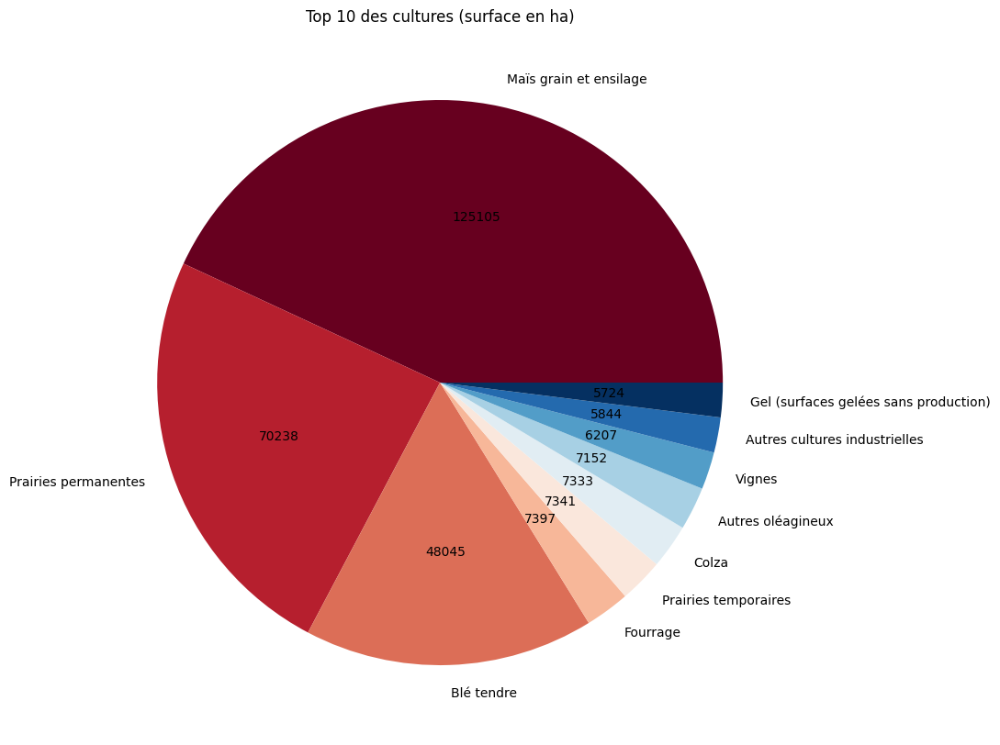

In [193]:
def func(pct,data):
    absolute = int(np.round(pct/100.*np.sum(data)))
    return f"{absolute:d}"

df_sorted.nlargest(10, "SURF_ADM").plot(figsize=(10, 10),autopct=lambda pct: func(pct,df_sorted.nlargest(10, "SURF_ADM")["SURF_ADM"].to_list()), kind="pie", x=df_sorted.index, y="SURF_ADM", legend=False, cmap='RdBu')
plt.ylabel("")
plt.title("Top 10 des cultures (surface en ha)")

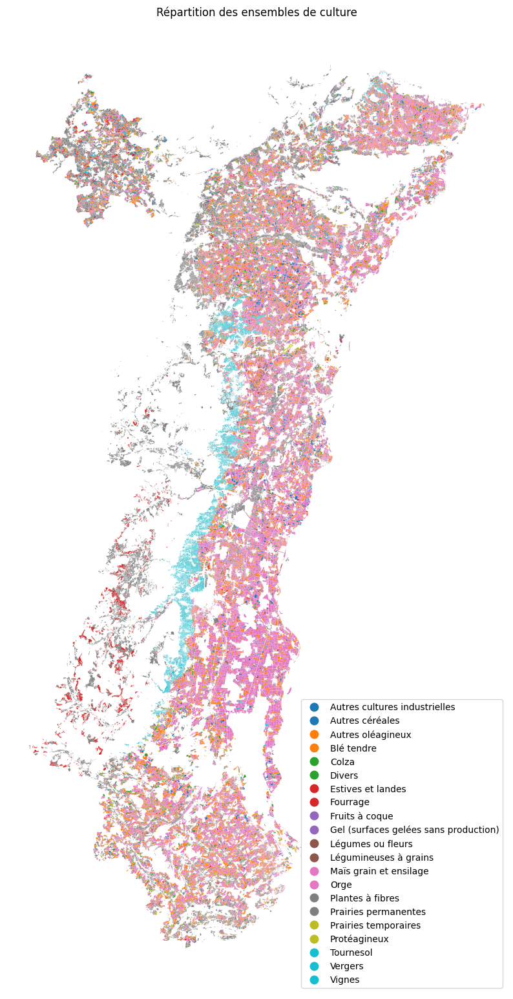

In [194]:
df.plot(figsize=(10, 20), column="LIBELLE_GROUPE_CULTURE", legend=True,  legend_kwds={'loc': 'lower right'})
plt.title("Répartition des ensembles de culture")
plt.axis('off')
plt.show()

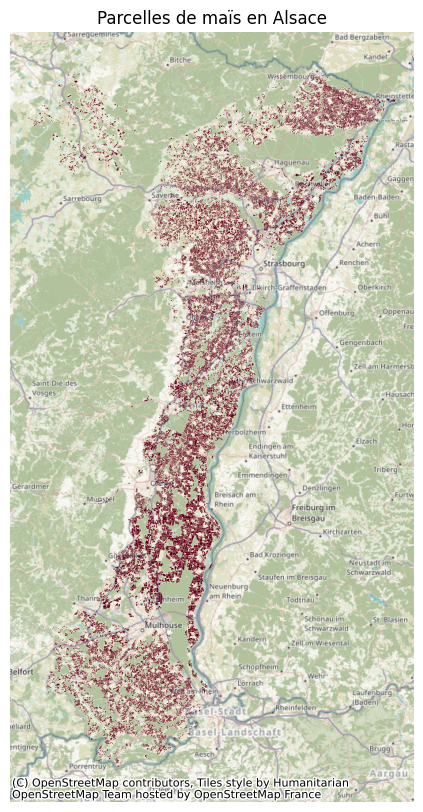

In [195]:
mais_grains_ensilage = df[df["LIBELLE_GROUPE_CULTURE"]=="Maïs grain et ensilage"]
ax = mais_grains_ensilage.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE", cmap="RdBu" , legend_kwds={'loc': 'lower right'})
plt.title("Parcelles de maïs en Alsace")
plt.axis('off')
cx.add_basemap(ax)


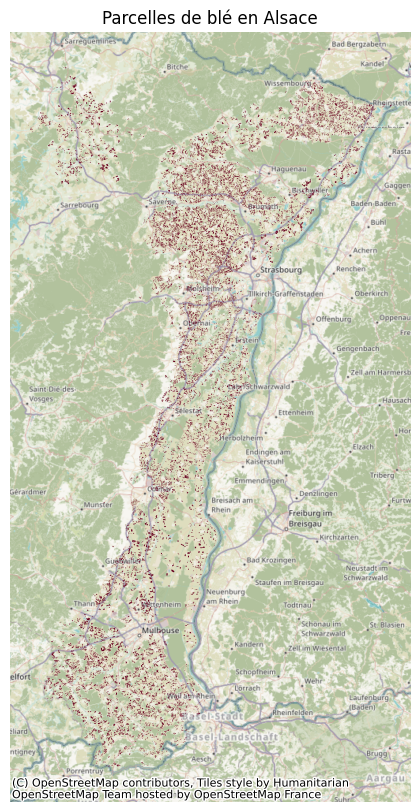

In [196]:
ble_tendre = df[df["LIBELLE_GROUPE_CULTURE"]=="Blé tendre"]
ax = ble_tendre.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE", cmap="RdBu", legend_kwds={'loc': 'lower right'})
plt.title("Parcelles de blé en Alsace")
plt.axis('off')
cx.add_basemap(ax)

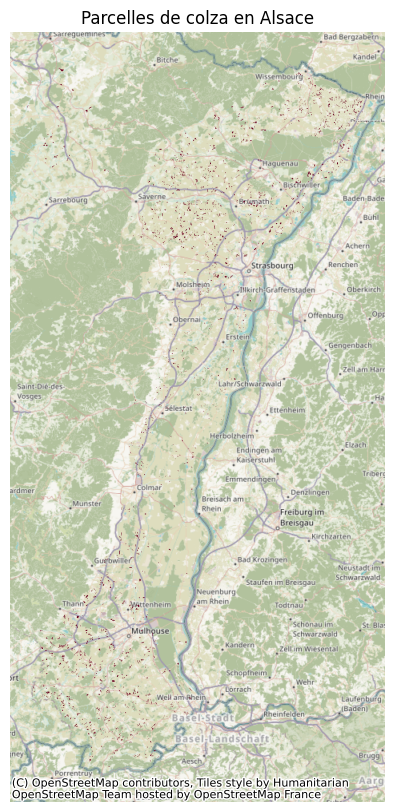

In [197]:
colza = df[df["LIBELLE_GROUPE_CULTURE"]=="Colza"]
ax = colza.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE", cmap="RdBu",  legend_kwds={'loc': 'lower right'})
plt.title("Parcelles de colza en Alsace")
plt.axis('off')
cx.add_basemap(ax)

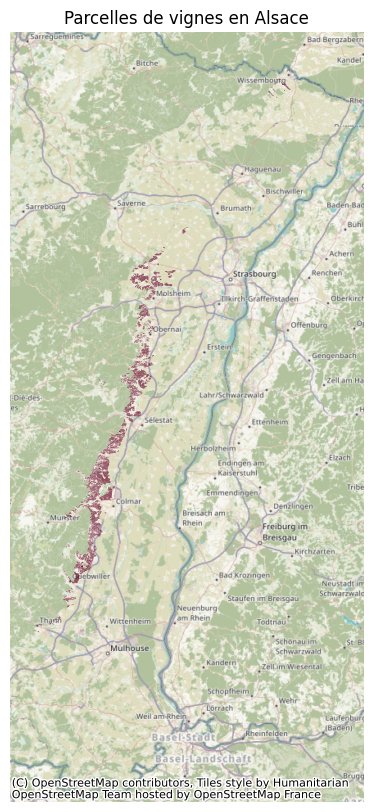

In [198]:
vignes = df[df["LIBELLE_GROUPE_CULTURE"]=="Vignes"]
ax = vignes.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE",cmap="RdBu",  legend_kwds={'loc': 'lower right'})
plt.title("Parcelles de vignes en Alsace")
plt.axis('off')
cx.add_basemap(ax)

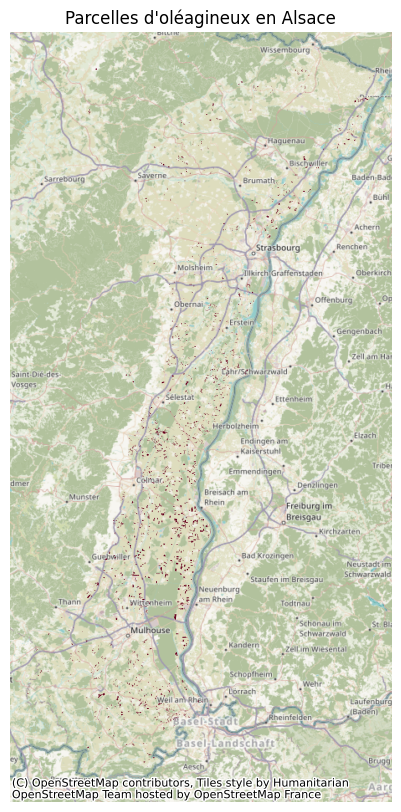

In [199]:
autre_oleagineux = df[df["LIBELLE_GROUPE_CULTURE"]=="Autres oléagineux"]
ax = autre_oleagineux.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE", cmap="RdBu",  legend_kwds={'loc': 'lower right'})
plt.title("Parcelles d'oléagineux en Alsace")
plt.axis('off')
cx.add_basemap(ax)

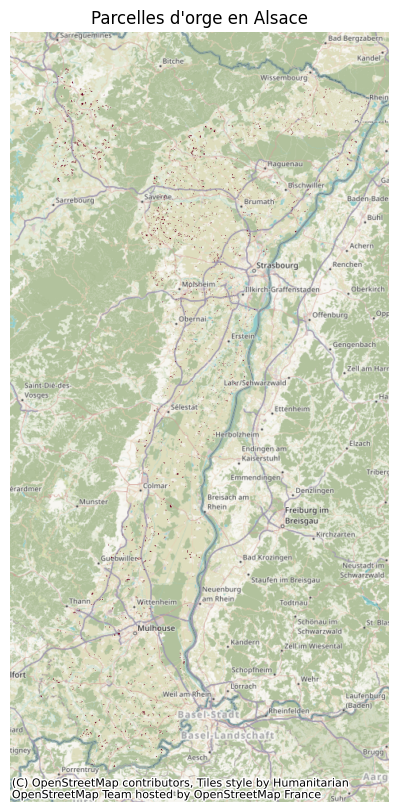

In [200]:
orge = df[df["LIBELLE_GROUPE_CULTURE"]=="Orge"]
ax = orge.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE", cmap="RdBu",  legend_kwds={'loc': 'lower right'})
plt.title("Parcelles d'orge en Alsace")
plt.axis('off')
cx.add_basemap(ax)

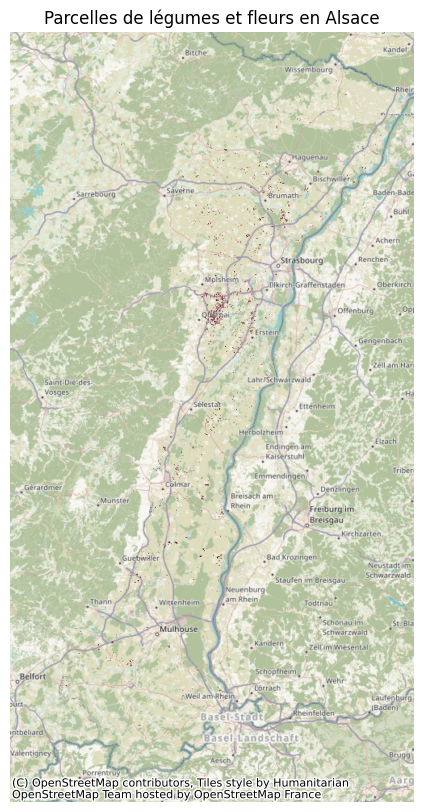

In [201]:
legumes_fleurs = df[df["LIBELLE_GROUPE_CULTURE"]=="Légumes ou fleurs"]
ax = legumes_fleurs.to_crs(epsg=3857).plot(figsize=(10, 10), column="LIBELLE_GROUPE_CULTURE", cmap="RdBu",  legend_kwds={'loc': 'lower right'})
plt.title("Parcelles de légumes et fleurs en Alsace")
plt.axis('off')
cx.add_basemap(ax)


# Cultures étudiées

* Maïs grain et ensilage
* Blé tendre
* Colza
* Vignes
* Autres oléagineux
* Orge
* Légumes ou fleurs



# Zero de végétation
Le zéro de végétation correspond à la température minimale à partir de laquelle une plante se développe

In [202]:
temp_culture = pd.read_csv("data/temperature_culture.csv", delimiter=";")
temp_culture

,Culture,Zéro de végétation,Temp max,Début Semis,Cumul DJ
0,Maïs grain et ensilage,6,30,15-mars,1630
1,Blé tendre,0,30,01-oct,1830
2,Colza,0,30,01-août,2330
3,Vignes,10,30,01-févr,1100
4,Autres oléagineux,0,30,15-sept,1870
5,Orge,0,30,01-févr,1700
6,Légumes ou fleurs,4,30,15-févr,1870


Text(0.5, 1.0, 'Zéro de végétation en fonction des cultures')

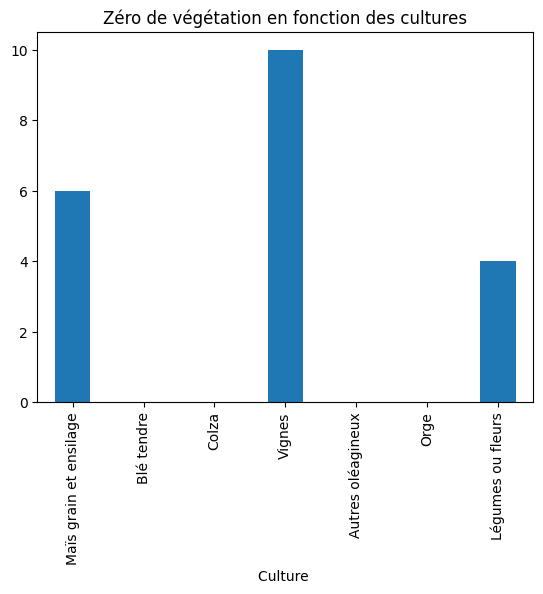

In [203]:
temp_culture.plot(x="Culture ", y="Zéro de végétation",legend=False, kind="bar")

plt.title("Zéro de végétation en fonction des cultures")

In [204]:
drias_1 = pd.read_csv("data/Evol_temp(67-68).txt", delimiter=";", skiprows=54)
drias_2 = pd.read_csv("data/evol_ray(67-68).txt", delimiter=";", skiprows=39)
drias = pd.merge(drias_1,drias_2, on=["Jour", "Mois", "Année","Latitude", "Longitude"])
drias


,Jour,Mois,Année,Latitude,Longitude,Temp_min,Temp_max,Temp_moyenne,Precipitation,Rayonnement
0,1,1,2006,47.4999,7.17144,269.55,277.15,271.98,0.000000,54.774
1,2,1,2006,47.4999,7.17144,271.25,280.71,277.08,0.000024,43.468
2,3,1,2006,47.4999,7.17144,279.17,280.35,279.93,0.000079,5.781
3,4,1,2006,47.4999,7.17144,280.11,283.31,281.64,0.000010,11.517
4,5,1,2006,47.4999,7.17144,278.02,284.68,281.13,0.000000,57.248
...,...,...,...,...,...,...,...,...,...,...
4580131,27,12,2100,48.9679,8.18429,273.22,281.82,276.93,0.000000,60.340
4580132,28,12,2100,48.9679,8.18429,274.62,284.51,280.06,0.000000,58.583
4580133,29,12,2100,48.9679,8.18429,277.13,281.14,279.40,0.000000,57.516
4580134,30,12,2100,48.9679,8.18429,276.03,284.33,280.61,0.000100,25.398


In [205]:
drias['Date'] = pd.to_datetime(dict(year=drias.Année, month=drias.Mois, day=drias.Jour))


In [206]:
drias

,Jour,Mois,Année,Latitude,Longitude,Temp_min,Temp_max,Temp_moyenne,Precipitation,Rayonnement,Date
0,1,1,2006,47.4999,7.17144,269.55,277.15,271.98,0.000000,54.774,2006-01-01
1,2,1,2006,47.4999,7.17144,271.25,280.71,277.08,0.000024,43.468,2006-01-02
2,3,1,2006,47.4999,7.17144,279.17,280.35,279.93,0.000079,5.781,2006-01-03
3,4,1,2006,47.4999,7.17144,280.11,283.31,281.64,0.000010,11.517,2006-01-04
4,5,1,2006,47.4999,7.17144,278.02,284.68,281.13,0.000000,57.248,2006-01-05
...,...,...,...,...,...,...,...,...,...,...,...
4580131,27,12,2100,48.9679,8.18429,273.22,281.82,276.93,0.000000,60.340,2100-12-27
4580132,28,12,2100,48.9679,8.18429,274.62,284.51,280.06,0.000000,58.583,2100-12-28
4580133,29,12,2100,48.9679,8.18429,277.13,281.14,279.40,0.000000,57.516,2100-12-29
4580134,30,12,2100,48.9679,8.18429,276.03,284.33,280.61,0.000100,25.398,2100-12-30


In [207]:
# Kelvin to Celsius
drias["Temp_moyenne"] = drias["Temp_moyenne"] - 273.15
drias["Temp_min"] = drias["Temp_min"] - 273.15
drias["Temp_max"] = drias["Temp_max"] - 273.15

In [208]:
#Récupération de coordonées uniques
drias["Longitude"].reset_index().groupby(by="Longitude").count()

,index
Longitude,
6.87796,34698
6.98455,34698
6.99087,34698
6.99721,34698
7.00356,34698
...,...
7.96647,34698
8.05950,34698
8.06743,34698


# Cartes comparaison temperature entre 2020 et 2100

In [210]:
drias_gpd = gpd.GeoDataFrame(
    drias, geometry=gpd.points_from_xy(drias.Longitude, drias.Latitude), crs="EPSG:4326"
)

In [211]:
drias_gr_year = drias[["Année","Latitude", "Longitude", "Temp_moyenne"]].groupby(["Latitude", "Longitude","Année"]).mean().reset_index()
minT = drias_gr_year["Temp_moyenne"].min()
maxT = drias_gr_year["Temp_moyenne"].max()
meanT = drias_gr_year['Temp_moyenne'].mean()
format = pd.concat([drias_gr_year['Année'],drias_gr_year.apply(lambda x : [x['Latitude'],x['Longitude'],(x['Temp_moyenne']-minT)/(maxT-minT)],axis = 1)],axis = 1).groupby('Année').apply(lambda x : x[0].to_list())
ind = format.index.to_list()
format = format.to_list()

/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/3417954196.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  format = pd.concat([drias_gr_year['Année'],drias_gr_year.apply(lambda x : [x['Latitude'],x['Longitude'],(x['Temp_moyenne']-minT)/(maxT-minT)],axis = 1)],axis = 1).groupby('Année').apply(lambda x : x[0].to_list())


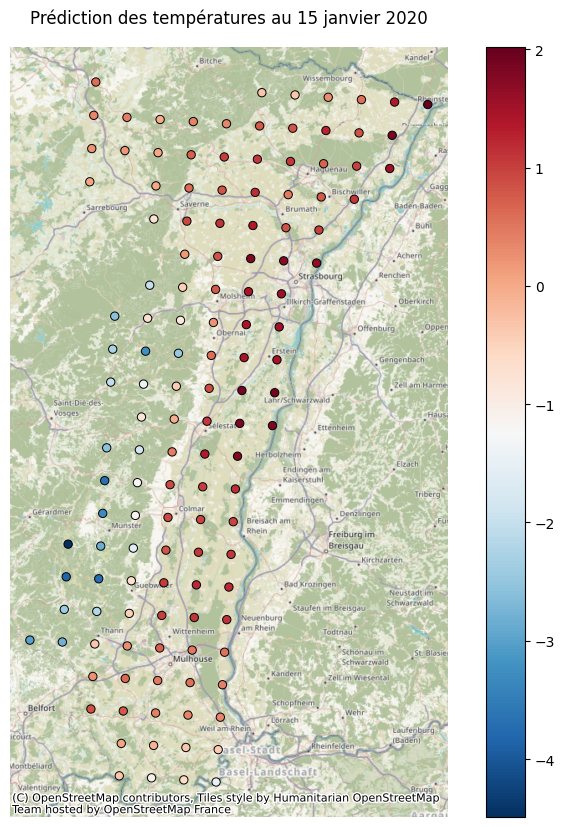

In [212]:
drias_20_janvier = drias_gpd[(drias_gpd["Date"]=="2020-01-15")]
ax = drias_20_janvier.to_crs(epsg=3857).plot(figsize=(10, 10), alpha=1, column="Temp_moyenne", cmap="RdBu_r", legend=True, edgecolor="black",linewidth=0.7)
plt.title("Prédiction des températures au 15 janvier 2020")
plt.axis('off')
cx.add_basemap(ax)

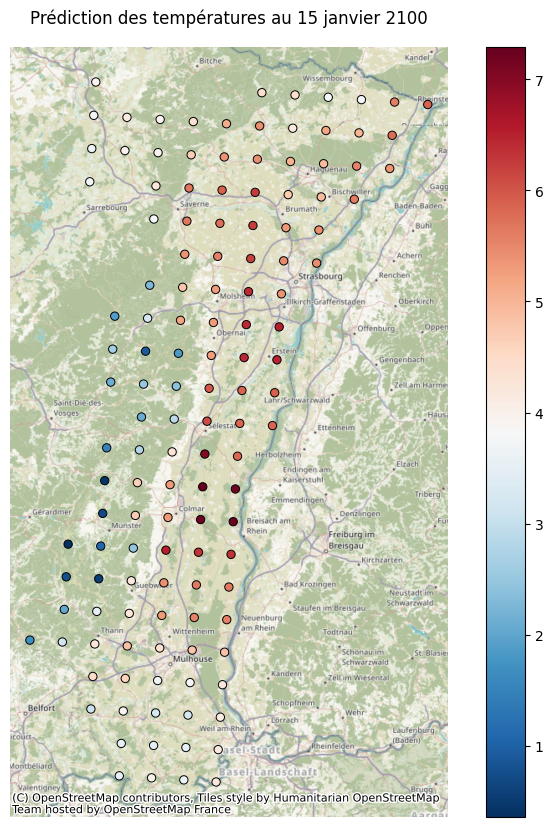

In [213]:
drias_100_janvier = drias_gpd[(drias_gpd["Date"]=="2100-01-15")]
ax = drias_100_janvier.to_crs(epsg=3857).plot(figsize=(10, 10), alpha=1, column="Temp_moyenne", cmap="RdBu_r", legend=True, edgecolor="black",linewidth=0.7)
plt.title("Prédiction des températures au 15 janvier 2100")
plt.axis('off')
cx.add_basemap(ax)

In [214]:
drias_20_juillet = drias_gpd[(drias_gpd["Date"]=="2020-07-15")]
#ax = drias_20_juillet.to_crs(epsg=3857).plot(figsize=(20, 20), alpha=1, column="Temp_moyenne", cmap="RdBu_r", legend=True, edgecolor="black",linewidth=0.7)
#cx.add_basemap(ax)

In [215]:
drias_100_juillet = drias_gpd[(drias_gpd["Date"]=="2100-07-15")]
#ax = drias_100_juillet.to_crs(epsg=3857).plot(figsize=(20, 20), alpha=1, column="Temp_moyenne", cmap="RdBu_r", legend=True, edgecolor="black",linewidth=0.7)
#cx.add_basemap(ax)

# Etude sur les relevés en longitude 8.05950

In [216]:
df_specific = drias[drias["Longitude"]==8.05950]

df_specific

,Jour,Mois,Année,Latitude,Longitude,Temp_min,Temp_max,Temp_moyenne,Precipitation,Rayonnement,Date
3955572,1,1,2006,48.8298,8.0595,-2.70,4.42,0.96,0.000000,60.237,2006-01-01
3955573,2,1,2006,48.8298,8.0595,1.92,8.13,6.31,0.000073,34.456,2006-01-02
3955574,3,1,2006,48.8298,8.0595,6.46,9.97,8.43,0.000186,7.497,2006-01-03
3955575,4,1,2006,48.8298,8.0595,9.87,11.93,11.20,0.000024,11.006,2006-01-04
3955576,5,1,2006,48.8298,8.0595,4.01,12.20,8.60,0.000000,49.128,2006-01-05
...,...,...,...,...,...,...,...,...,...,...,...
3990265,27,12,2100,48.8298,8.0595,1.38,10.63,5.36,0.000000,57.002,2100-12-27
3990266,28,12,2100,48.8298,8.0595,2.84,12.15,7.96,0.000000,55.409,2100-12-28
3990267,29,12,2100,48.8298,8.0595,5.00,9.46,7.53,0.000000,53.546,2100-12-29
3990268,30,12,2100,48.8298,8.0595,5.39,11.83,8.94,0.000088,19.159,2100-12-30


/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/1523776838.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_specific["Temp_moyenne_avg"] = df_specific["Temp_moyenne"].rolling(365).mean()


Text(0.5, 1.0, 'Evolution de la moyenne de température (moyenne glissante sur 365 jours)')

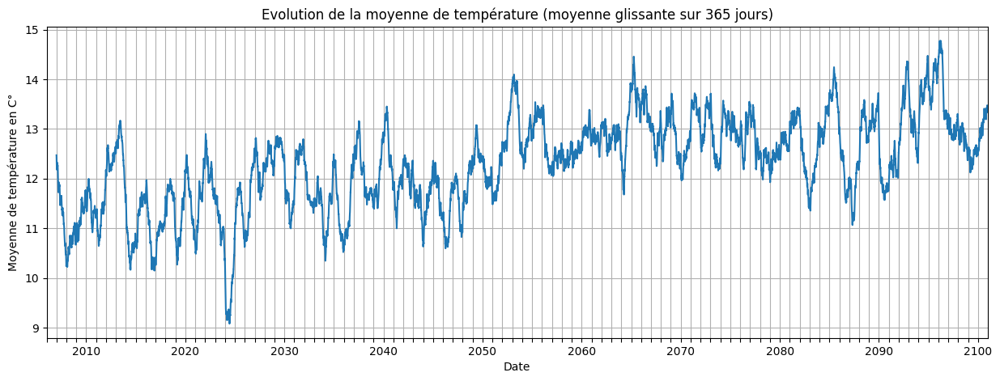

In [217]:
#Evolution de la temp moyenne 
df_specific["Temp_moyenne_avg"] = df_specific["Temp_moyenne"].rolling(365).mean()
df_specific.plot(kind="line", x="Date", y="Temp_moyenne_avg", figsize=(15, 5))
plt.grid()
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.YearLocator())
plt.gca().legend().remove()
plt.ylabel("Moyenne de température en C°")
plt.title("Evolution de la température moyenne (moyenne glissante sur 365 jours)")

/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/664716485.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_specific["Precipitation_avg"] = df_specific["Precipitation"].rolling(365).mean()


Text(0.5, 1.0, 'Evolution de la moyenne de précipitation (moyenne glissante sur 365 jours)')

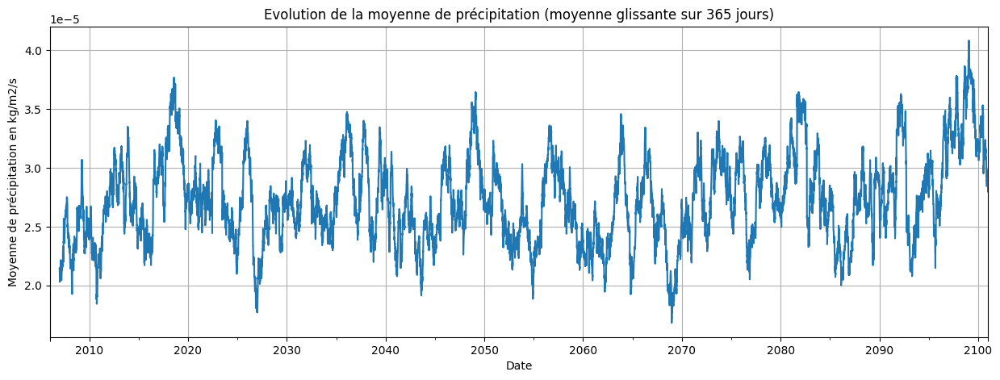

In [218]:
df_specific["Precipitation_avg"] = df_specific["Precipitation"].rolling(365).mean()
df_specific.plot(kind="line", x="Date", y="Precipitation_avg", figsize=(15, 5))
plt.grid()
#plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.YearLocator())
plt.gca().legend().remove()
plt.ylabel("Moyenne de précipitation en kg/m2/s")
plt.title("Evolution de la précipitation moyenne (moyenne glissante sur 365 jours)")

/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/3095020611.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_specific["Rayonnement_avg"] = df_specific["Rayonnement"].rolling(365).mean()


Text(0.5, 1.0, 'Evolution de la moyenne de rayonnement (moyenne glissante sur 365 jours)')

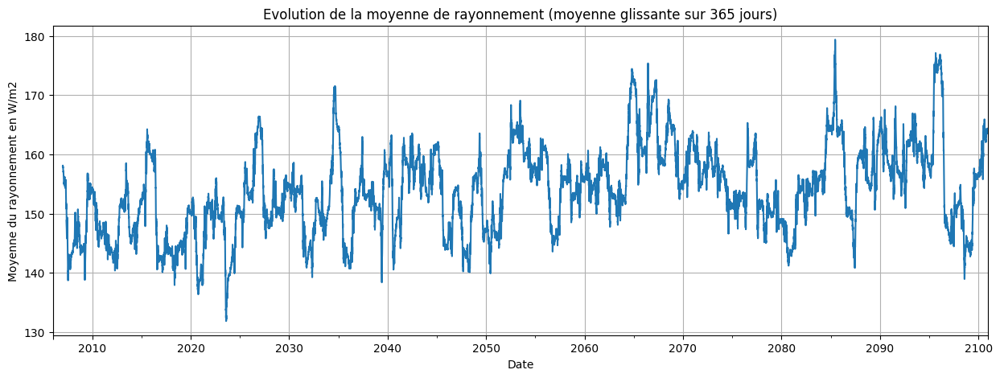

In [219]:
df_specific["Rayonnement_avg"] = df_specific["Rayonnement"].rolling(365).mean()
df_specific.plot(kind="line", x="Date", y="Rayonnement_avg", figsize=(15, 5))
plt.grid()
plt.gca().legend().remove()
plt.ylabel("Moyenne du rayonnement en W/m2")
plt.title("Evolution du rayonnement moyen (moyenne glissante sur 365 jours)")

In [220]:
unique_year = pd.DatetimeIndex(df_specific["Date"]).year.unique()
jour_temp = pd.DataFrame(data={'Année': unique_year})

for index, row in jour_temp.iterrows():
    jour_temp.at[index,'inf_0'] = df_specific[(df_specific["Temp_moyenne"] < 0) & (df_specific["Année"] == row["Année"])].count()["Temp_moyenne"]
    jour_temp.at[index,'inf_4'] = df_specific[(df_specific["Temp_moyenne"] < 4) & (df_specific["Année"] == row["Année"])].count()["Temp_moyenne"]
    jour_temp.at[index,'inf_6'] = df_specific[(df_specific["Temp_moyenne"] < 6) & (df_specific["Année"] == row["Année"])].count()["Temp_moyenne"]
    jour_temp.at[index,'inf_10'] = df_specific[(df_specific["Temp_moyenne"] < 10) & (df_specific["Année"] == row["Année"])].count()["Temp_moyenne"]
    jour_temp.at[index,'sup_30'] = df_specific[(df_specific["Temp_moyenne"] >= 30) & (df_specific["Année"] == row["Année"])].count()["Temp_moyenne"]

Text(0.5, 1.0, 'Evolution du nombre de jours sous 0 degré')

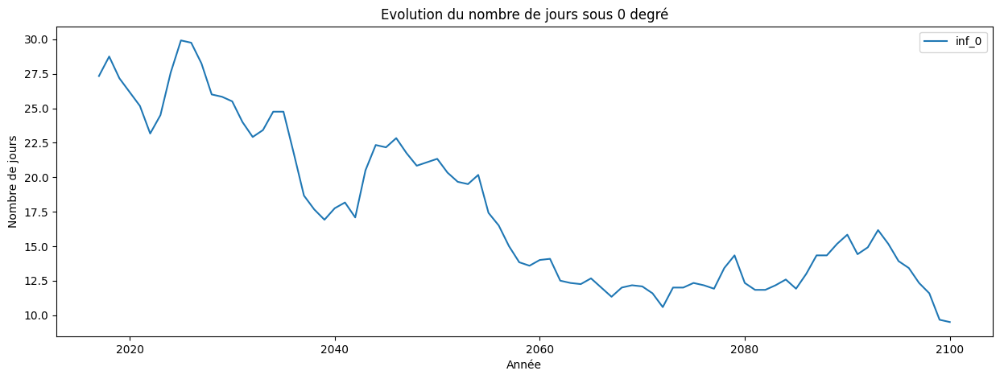

In [221]:
jour_temp["inf_0"] = jour_temp["inf_0"].rolling(12).mean()
jour_temp.plot(kind="line", x="Année", y="inf_0", figsize=(15, 5))
plt.ylabel("Nombre de jours")
plt.title("Evolution du nombre de jours sous 0 degré")

Text(0.5, 1.0, 'Evolution du nombre de jours sous 4 degrés')

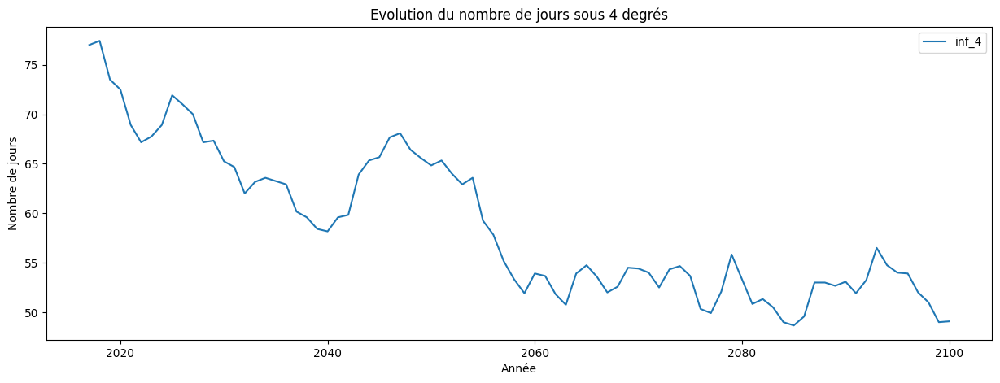

In [222]:
jour_temp["inf_4"] = jour_temp["inf_4"].rolling(12).mean()
jour_temp.plot(kind="line", x="Année", y="inf_4", figsize=(15, 5))
plt.ylabel("Nombre de jours")
plt.title("Evolution du nombre de jours sous 4 degrés")

Text(0.5, 1.0, 'Evolution du nombre de jours sous 6 degrés')

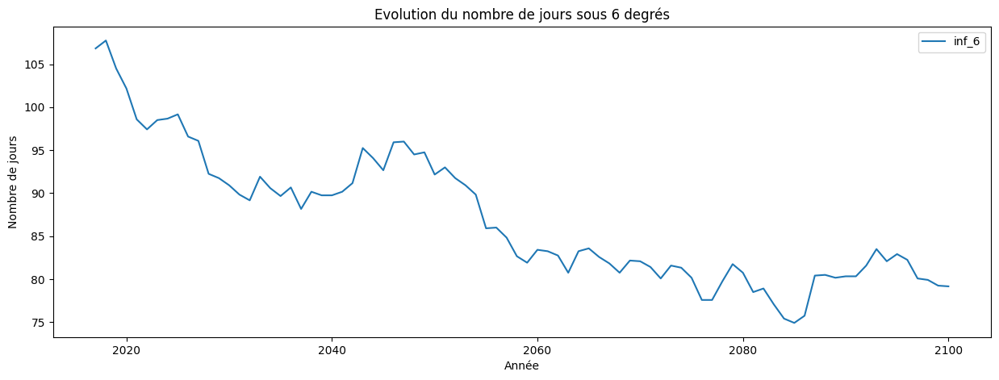

In [223]:
jour_temp["inf_6"] = jour_temp["inf_6"].rolling(12).mean()
jour_temp.plot(kind="line", x="Année", y="inf_6", figsize=(15, 5))
plt.ylabel("Nombre de jours")
plt.title("Evolution du nombre de jours sous 6 degrés")

Text(0.5, 1.0, 'Evolution du nombre de jours sous 10 degrés')

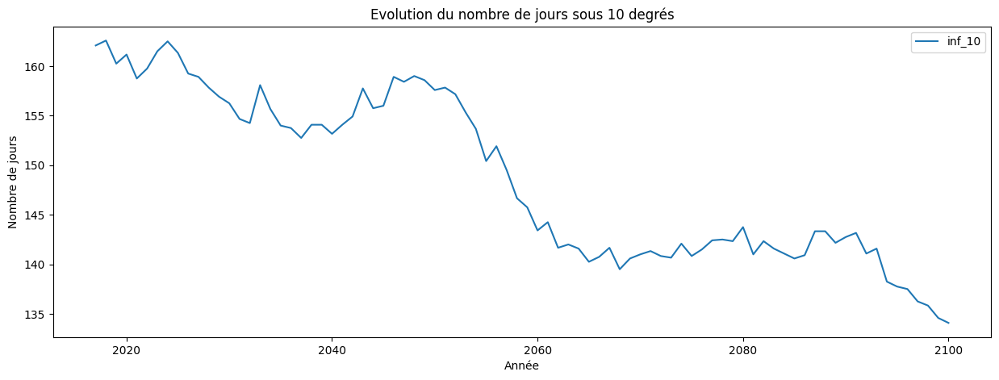

In [224]:
jour_temp["inf_10"] = jour_temp["inf_10"].rolling(12).mean()
jour_temp.plot(kind="line", x="Année", y="inf_10", figsize=(15, 5))
plt.ylabel("Nombre de jours")
plt.title("Evolution du nombre de jours sous 10 degrés")

Text(0.5, 1.0, 'Evolution du nombre de jours au dessus de 30 degrés')

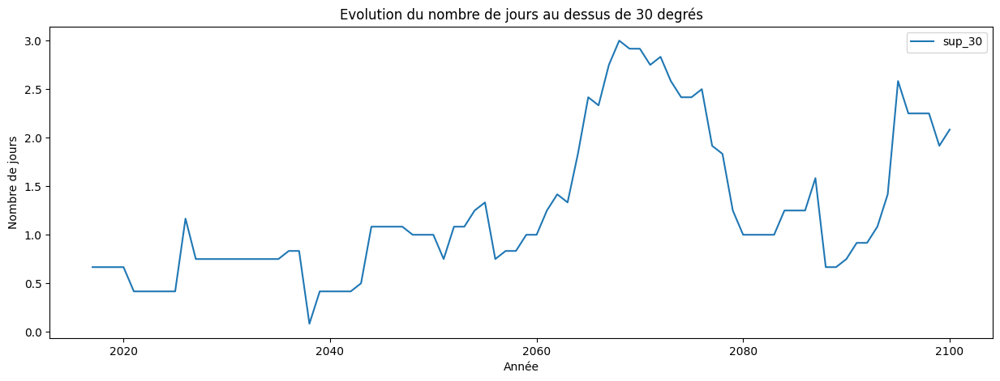

In [225]:
jour_temp["sup_30"] = jour_temp["sup_30"].rolling(12).mean()
jour_temp.plot(kind="line", x="Année", y="sup_30", figsize=(15, 5))
plt.ylabel("Nombre de jours")
plt.title("Evolution du nombre de jours au dessus de 30 degrés")

# Exploiter de nouveaux indicateurs 

* Degré jour 

* Cumul de précipitation

* Gelée (date_inf, date_sup, nombre de jour d'intervalle, nombre de gelé)

* Reprise de la végétation (cumul de temp > 200 C)

* Nombre de jour échaudants (température supérieure a 25°C et ceci du 1er avril au 30 juin)

https://www.drias-climat.fr/accompagnement/sections/250


### Construction des indicateurs 

In [226]:
year = 2006
cumul_temperature = 0
cumul_precipitation = 0
cumul_jour_echaudant = 0
cumul_jour_gele = 0

vegetation = False

nb_Mais = 0 
cumul_DJ_Mais = 0

nb_Ble = 0
cumul_DJ_Ble = 0

nb_Colza = 0
cumul_DJ_Colza = 0

nb_Vignes = 0
cumul_DJ_Vignes = 0

nb_Oleagineux = 0
cumul_DJ_Oleagineux = 0

nb_Orges = 0
cumul_DJ_Orges = 0

nb_Légumes = 0
cumul_DJ_Légumes = 0


for index, row in df_specific.iterrows():
    df_specific.at[index,'DJ_0'] = max((row["Temp_min"] + min(row["Temp_max"], 30))/2-0,0)
    df_specific.at[index,'DJ_4'] = max((row["Temp_min"] + min(row["Temp_max"], 30))/2-4,0)
    df_specific.at[index,'DJ_6'] = max((row["Temp_min"] + min(row["Temp_max"], 30))/2-6,0)
    df_specific.at[index,'DJ_10'] = max((row["Temp_min"] + min(row["Temp_max"], 30))/2-10,0)

    if row["Année"] != year:
        cumul_temperature = 0
        cumul_precipitation = 0
        cumul_jour_echaudant = 0
        cumul_jour_gele = 0
        vegetation = False

        nb_Mais = 0 
        cumul_DJ_Mais = 0

        nb_Ble = 0
        cumul_DJ_Ble = 0

        nb_Colza = 0
        cumul_DJ_Colza = 0

        nb_Vignes = 0
        cumul_DJ_Vignes = 0

        nb_Oleagineux = 0
        cumul_DJ_Oleagineux = 0

        nb_Orges = 0
        cumul_DJ_Orges = 0

        nb_Légumes = 0
        cumul_DJ_Légumes = 0


        year = row["Année"]

    #Cumul jour gele 
    if row["Temp_max"] <= 0:
        df_specific.at[index,'Cumul_jour_gele'] = cumul_jour_gele + 1
        cumul_jour_gele = df_specific.at[index,'Cumul_jour_gele']

    #Cumul jour echaudant
    if row["Mois"] >= 4 and row["Mois"] <= 6 and row["Temp_max"] > 25:
        df_specific.at[index,'Cumul_jour_echaudant'] = cumul_jour_echaudant + 1 
        cumul_jour_echaudant = df_specific.at[index,'Cumul_jour_echaudant']
        
    #Cumul précipitations
    if row["Mois"] >= 4 and row["Mois"] <= 10:
        df_specific.at[index,'Cumul_precipitation'] = cumul_precipitation + row["Precipitation"]
        cumul_precipitation = df_specific.at[index,'Cumul_precipitation']

    #Cumul température
    if row["Temp_moyenne"] < 0 :
        df_specific.at[index,'Cumul_temperature'] = cumul_temperature
    else:
        df_specific.at[index,'Cumul_temperature'] = row["Temp_moyenne"] + cumul_temperature
        cumul_temperature = df_specific.at[index,'Cumul_temperature']
    
    #Nombre de pousse possible sur chaque année

    #Zero de végétation
    if df_specific.at[index,'Cumul_temperature'] >= 200:

        #Marquer le début de végétation
        if vegetation == False:
            df_specific.at[index,'Nb_dev_mais'] = 0
            df_specific.at[index,'Nb_dev_ble'] = 0
            df_specific.at[index,'Nb_dev_colza'] = 0
            df_specific.at[index,'Nb_dev_vignes'] = 0
            df_specific.at[index,'Nb_dev_oleagineux'] = 0
            df_specific.at[index,'Nb_dev_orges'] = 0
            df_specific.at[index,'Nb_dev_légumes'] = 0
            vegetation = True

        #Période d'avant gêle 
        if row["Mois"] <= 10:
            cumul_DJ_Mais = cumul_DJ_Mais + df_specific.at[index,'DJ_6']
            cumul_DJ_Ble =  cumul_DJ_Ble + df_specific.at[index,'DJ_0']
            cumul_DJ_Colza =  cumul_DJ_Colza + df_specific.at[index,'DJ_0']
            cumul_DJ_Vignes =  cumul_DJ_Vignes + df_specific.at[index,'DJ_10']
            cumul_DJ_Oleagineux =  cumul_DJ_Oleagineux + df_specific.at[index,'DJ_0']
            cumul_DJ_Orges =  cumul_DJ_Orges + df_specific.at[index,'DJ_0']
            cumul_DJ_Légumes =  cumul_DJ_Légumes + df_specific.at[index,'DJ_4']

            #Incrémentation le nombre de pousse si fin de développement
            if cumul_DJ_Mais >= temp_culture[temp_culture["Culture "] == "Maïs grain et ensilage"]["Cumul DJ"][0]:
                nb_Mais = nb_Mais + 1
                df_specific.at[index,'Nb_dev_mais'] = nb_Mais
                cumul_DJ_Mais = 0

            if cumul_DJ_Ble >= temp_culture[temp_culture["Culture "] == "Blé tendre"]["Cumul DJ"].values[0]:
                nb_Ble = nb_Ble + 1
                df_specific.at[index,'Nb_dev_ble'] = nb_Ble
                cumul_DJ_Ble = 0
            
            if cumul_DJ_Colza >= temp_culture[temp_culture["Culture "] == "Colza"]["Cumul DJ"].values[0]:
                nb_Colza = nb_Colza + 1
                df_specific.at[index,'Nb_dev_colza'] = nb_Colza
                cumul_DJ_Colza = 0
            
            if cumul_DJ_Vignes >= temp_culture[temp_culture["Culture "] == "Vignes"]["Cumul DJ"].values[0]:
                nb_Vignes = nb_Vignes + 1
                df_specific.at[index,'Nb_dev_vignes'] = nb_Vignes
                cumul_DJ_Vignes = 0
            
            if cumul_DJ_Oleagineux >= temp_culture[temp_culture["Culture "] == "Autres oléagineux"]["Cumul DJ"].values[0]:
                nb_Oleagineux = nb_Oleagineux + 1
                df_specific.at[index,'Nb_dev_oleagineux'] = nb_Oleagineux
                cumul_DJ_Oleagineux = 0
            
            if cumul_DJ_Orges >= temp_culture[temp_culture["Culture "] == "Orge"]["Cumul DJ"].values[0]:
                nb_Orges = nb_Orges + 1
                df_specific.at[index,'Nb_dev_orges'] = nb_Orges
                cumul_DJ_Orges = 0
            
            if cumul_DJ_Légumes >= temp_culture[temp_culture["Culture "] == "Légumes ou fleurs"]["Cumul DJ"].values[0]:
                nb_Légumes = nb_Légumes + 1
                df_specific.at[index,'Nb_dev_légumes'] = nb_Légumes
                cumul_DJ_Légumes = 0



/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/521134498.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_specific.at[index,'DJ_0'] = max((row["Temp_min"] + min(row["Temp_max"], 30))/2-0,0)
/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/521134498.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_specific.at[index,'DJ_4'] = max((row["Temp_min"] + min(row["Temp_max"], 30))/2-4,0)
/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/521134498.py:34: Set

### Evolution du nombre de jours echaudants et estimation de l'évolution des pertes en blé 

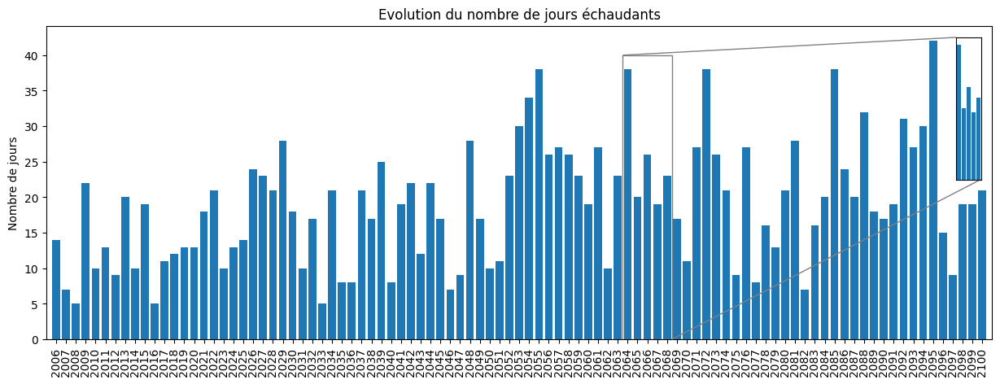

In [227]:
#Evolution du nombre de jour echaudant entre avril et juin
jour_echaudant = df_specific[["Année", "Cumul_jour_echaudant"]].groupby(["Année"], as_index=False).max()
#jour_echaudant.plot(kind="bar", y="Cumul_jour_echaudant", x="Année" ,figsize=(30, 10))

f, ax = plt.subplots(1, figsize=(15, 5))

ax.bar(jour_echaudant["Année"], jour_echaudant["Cumul_jour_echaudant"])
plt.xlim(2006-1, max(jour_echaudant["Année"])+1) 
plt.xticks(jour_echaudant["Année"], rotation=90)
plt.ylabel("Nombre de jours")
plt.title("Evolution du nombre de jours échaudants")
#plt.axhline(y=jour_echaudant["Cumul_jour_echaudant"].mean(), color="red")
axins = zoomed_inset_axes(ax, zoom=0.5, loc='upper right', borderpad=1.0)
axins.bar(jour_echaudant["Année"], jour_echaudant["Cumul_jour_echaudant"])
axins.yaxis.set_visible(False)
axins.xaxis.set_visible(False)
axins.set(xlim=[2063.5, 2068.5], ylim=[0, 40])
mark_inset(ax, axins, loc1=2, loc2=4, fc='none', ec='grey')


plt.show()



In [228]:
#Un jour échaudant entrâine 1,5 q/ha de perte pour le blé
surface_ble = 48044
production_ha_ble = 73.4
for index, row in jour_echaudant.iterrows():
    jour_echaudant.at[index,'Perte totale en quintal'] = 1.5*surface_ble*row["Cumul_jour_echaudant"]
    jour_echaudant.at[index,'Perte totale %'] = (jour_echaudant.at[index,'Perte totale en quintal']/(surface_ble*production_ha_ble))*100


Text(0.5, 1.0, 'Prévision de la dégradation des cultures de blé (rouge = perte > 50 %)')

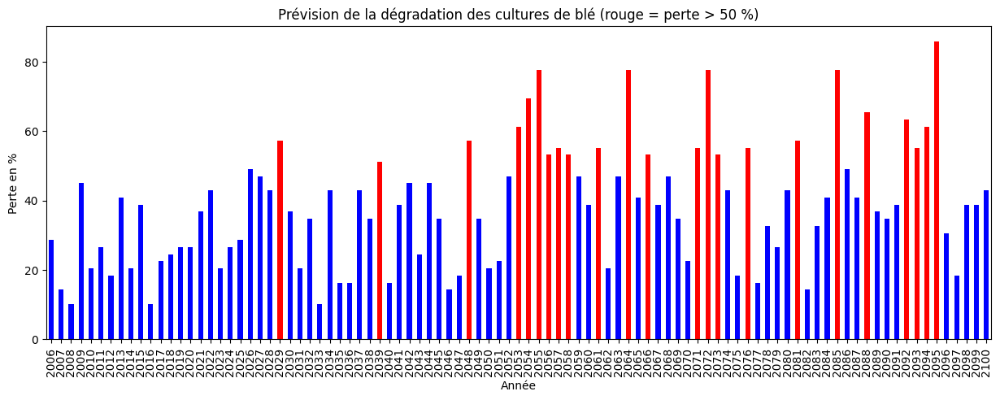

In [229]:
#Evolution des pertes potentiels 
jour_echaudant.plot(kind="bar", y="Perte totale %",x="Année",figsize=(15, 5), legend=False, color=np.where(jour_echaudant["Perte totale %"] > 50, 'r', 'b'))
plt.ylabel("Perte en %")
plt.title("Prévision de la dégradation des cultures de blé (rouge = perte > 50 %)")

In [230]:
pertes = jour_echaudant["Perte totale %"].to_list()

format_perte = format

for index, value in enumerate(format_perte):
    for record in format_perte[index]:
        record[2] = 1-(pertes[index]/100)

map = folium.plugins.DualMap(location=[47, 7], zoom_start=7,speed_step=1, use_local_extrema=True)
plugins.HeatMapWithTime(format,index=ind, scale_radius=True,gradient={'.3': 'green','.62': 'orange', '.8': 'red'}, radius=0.065, auto_play=True).add_to(map.m1)
plugins.HeatMapWithTime(format_perte,index=ind, scale_radius=True,gradient={'.3':'red','.5': 'orange','.6': 'green'}, radius=0.065,auto_play=True).add_to(map.m2)

map

### Evolution du nombre de gelés

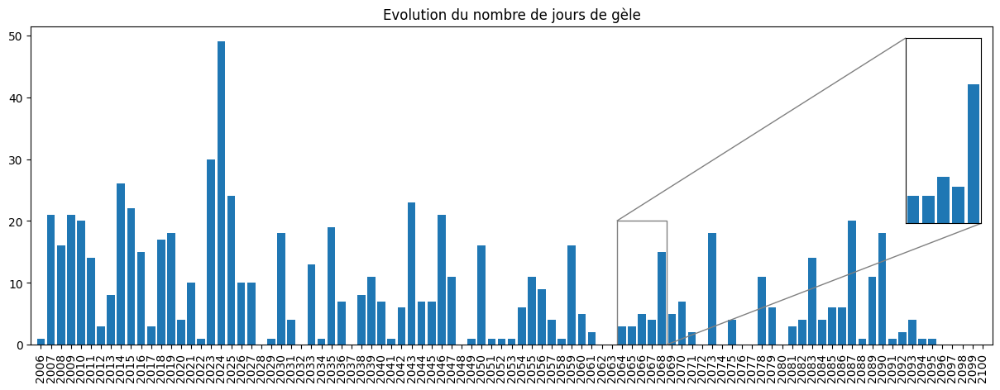

In [231]:
#Evolution du nombre de jour de gêle  
jour_gele = df_specific[["Année", "Cumul_jour_gele"]].groupby(["Année"], as_index=False).max()

#ax = jour_gele.plot(kind="bar", y="Cumul_jour_gele", x="Année" ,figsize=(30, 10))

f, ax = plt.subplots(1, figsize=(15, 5))

ax.bar(jour_gele["Année"], jour_gele["Cumul_jour_gele"])
plt.xlim(2006-1, max(jour_gele["Année"])+1) 
plt.xticks(jour_gele["Année"], rotation=90)
plt.title("Evolution du nombre de jours de gèle")
axins = zoomed_inset_axes(ax, zoom=1.5, loc='upper right', borderpad=1.0)
axins.bar(jour_gele["Année"], jour_gele["Cumul_jour_gele"])
axins.yaxis.set_visible(False)
axins.xaxis.set_visible(False)
axins.set(xlim=[2063.5, 2068.5], ylim=[0, 20])
mark_inset(ax, axins, loc1=2, loc2=4, fc='none', ec='grey')

plt.show()


### Evolution du cumul de précipitations 


<Axes: xlabel='Année'>

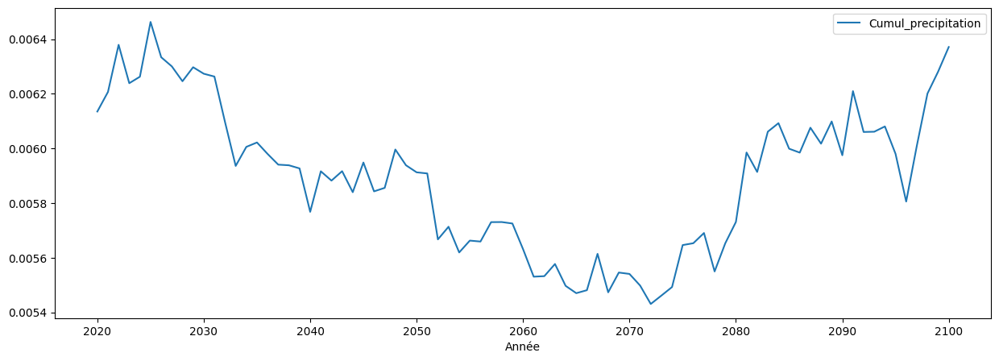

In [232]:
#Visualisation du cumul de précipitations par année 
précipitation_cumulée = df_specific[["Année", "Cumul_precipitation"]].groupby(["Année"], as_index=False).max()
précipitation_cumulée["Cumul_precipitation"] = précipitation_cumulée["Cumul_precipitation"].rolling(15).mean()
précipitation_cumulée.plot(kind="line", y="Cumul_precipitation", x="Année" ,figsize=(15, 5))


### Comparaison entre deux années (2020 et [2050, 2080, 2095])

* Reprise de végétation 
* Récolte des # cultures 
* Date de gèle
* Date de jour échaudant 

In [234]:
df_specific

,Jour,Mois,Année,Latitude,Longitude,Temp_min,Temp_max,Temp_moyenne,Precipitation,Rayonnement,...,Cumul_jour_gele,Nb_dev_mais,Nb_dev_ble,Nb_dev_colza,Nb_dev_vignes,Nb_dev_oleagineux,Nb_dev_orges,Nb_dev_légumes,Cumul_precipitation,Cumul_jour_echaudant
3955572,1,1,2006,48.8298,8.0595,-2.70,4.42,0.96,0.000000,60.237,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3955573,2,1,2006,48.8298,8.0595,1.92,8.13,6.31,0.000073,34.456,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3955574,3,1,2006,48.8298,8.0595,6.46,9.97,8.43,0.000186,7.497,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3955575,4,1,2006,48.8298,8.0595,9.87,11.93,11.20,0.000024,11.006,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3955576,5,1,2006,48.8298,8.0595,4.01,12.20,8.60,0.000000,49.128,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3990265,27,12,2100,48.8298,8.0595,1.38,10.63,5.36,0.000000,57.002,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3990266,28,12,2100,48.8298,8.0595,2.84,12.15,7.96,0.000000,55.409,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3990267,29,12,2100,48.8298,8.0595,5.00,9.46,7.53,0.000000,53.546,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3990268,30,12,2100,48.8298,8.0595,5.39,11.83,8.94,0.000088,19.159,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Création d'un graphique pour comparer les années 

In [235]:
df_specific["Date_base"] = pd.to_datetime(dict(year=2000, month=df_specific.Mois, day=df_specific.Jour))

/var/folders/zs/l6dhjfkn5hdcljvsqx5f3fc40000gn/T/ipykernel_6919/3189051156.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_specific["Date_base"] = pd.to_datetime(dict(year=2000, month=df_specific.Mois, day=df_specific.Jour))


In [236]:
df_specific.columns

Index(['Jour', 'Mois', 'Année', 'Latitude', 'Longitude', 'Temp_min',
       'Temp_max', 'Temp_moyenne', 'Precipitation', 'Rayonnement', 'Date',
       'Temp_moyenne_avg', 'Precipitation_avg', 'Rayonnement_avg', 'DJ_0',
       'DJ_4', 'DJ_6', 'DJ_10', 'Cumul_temperature', 'Cumul_jour_gele',
       'Nb_dev_mais', 'Nb_dev_ble', 'Nb_dev_colza', 'Nb_dev_vignes',
       'Nb_dev_oleagineux', 'Nb_dev_orges', 'Nb_dev_légumes',
       'Cumul_precipitation', 'Cumul_jour_echaudant', 'Date_base'],
      dtype='object')

In [237]:
date_reprise_vegetation = df_specific[(df_specific["Nb_dev_mais"]==0) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

date_recolte_mais = df_specific[(df_specific["Nb_dev_mais"]==1) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

date_recolte_ble = df_specific[(df_specific["Nb_dev_ble"]==1) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

date_recolte_colza = df_specific[(df_specific["Nb_dev_colza"]==1) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

date_recolte_vignes = df_specific[(df_specific["Nb_dev_vignes"]==1) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

date_recolte_oleagineux = df_specific[(df_specific["Nb_dev_oleagineux"]==1) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

date_recolte_orges = df_specific[(df_specific["Nb_dev_orges"]==1) & ((df_specific["Année"]==2020) | 
(df_specific["Année"]==2050) | (df_specific["Année"]==2080) | (df_specific["Année"]==2100))]["Date_base"].to_list()

data_jour_echaudant_2020 = df_specific[(df_specific["Cumul_jour_echaudant"]>=1) & (df_specific["Année"]==2020)]["Date_base"].to_list()

data_jour_echaudant_2050 = df_specific[(df_specific["Cumul_jour_echaudant"]>=1) & (df_specific["Année"]==2050)]["Date_base"].to_list()

data_jour_echaudant_2080 = df_specific[(df_specific["Cumul_jour_echaudant"]>=1) & (df_specific["Année"]==2080)]["Date_base"].to_list()

data_jour_echaudant_2100 = df_specific[(df_specific["Cumul_jour_echaudant"]>=1) & (df_specific["Année"]==2100)]["Date_base"].to_list()

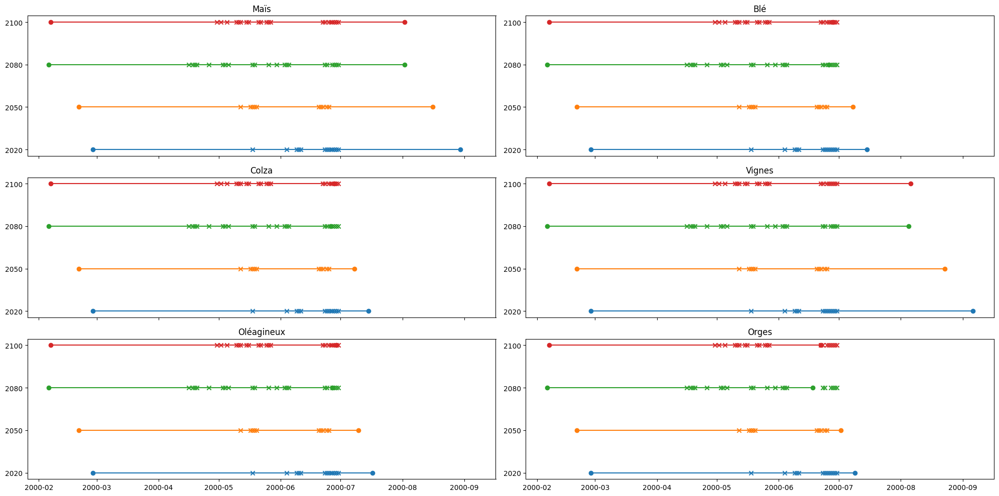

In [238]:

fig, ax = plt.subplots(3,2,figsize=(20, 10), sharex=True)
ax[0,0].plot([date_reprise_vegetation[0],date_recolte_mais[0]],[1,1],  marker="o")
ax[0,0].plot([date_reprise_vegetation[1],date_recolte_mais[1]],[2,2],  marker="o")
ax[0,0].plot([date_reprise_vegetation[2],date_recolte_mais[2]],[3,3],  marker="o")
ax[0,0].plot([date_reprise_vegetation[3],date_recolte_mais[3]],[4,4],  marker="o")
ax[0,0].scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
ax[0,0].scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
ax[0,0].scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
ax[0,0].scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")

ax[0,1].plot([date_reprise_vegetation[0],date_recolte_ble[0]],[1,1],  marker="o")
ax[0,1].plot([date_reprise_vegetation[1],date_recolte_ble[1]],[2,2],  marker="o")
ax[0,1].plot([date_reprise_vegetation[2],date_recolte_ble[2]],[3,3],  marker="o")
ax[0,1].plot([date_reprise_vegetation[3],date_recolte_ble[3]],[4,4],  marker="o")
ax[0,1].scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
ax[0,1].scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
ax[0,1].scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
ax[0,1].scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")

ax[1,0].plot([date_reprise_vegetation[0],date_recolte_ble[0]],[1,1],  marker="o")
ax[1,0].plot([date_reprise_vegetation[1],date_recolte_ble[1]],[2,2],  marker="o")
ax[1,0].plot([date_reprise_vegetation[2],date_recolte_ble[2]],[3,3],  marker="o")
ax[1,0].plot([date_reprise_vegetation[3],date_recolte_ble[3]],[4,4],  marker="o")
ax[1,0].scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
ax[1,0].scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
ax[1,0].scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
ax[1,0].scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")

ax[1,1].plot([date_reprise_vegetation[0],date_recolte_vignes[0]],[1,1],  marker="o")
ax[1,1].plot([date_reprise_vegetation[1],date_recolte_vignes[1]],[2,2],  marker="o")
ax[1,1].plot([date_reprise_vegetation[2],date_recolte_vignes[2]],[3,3],  marker="o")
ax[1,1].plot([date_reprise_vegetation[3],date_recolte_vignes[3]],[4,4],  marker="o")
ax[1,1].scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
ax[1,1].scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
ax[1,1].scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
ax[1,1].scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")

ax[2,0].plot([date_reprise_vegetation[0],date_recolte_oleagineux[0]],[1,1],  marker="o")
ax[2,0].plot([date_reprise_vegetation[1],date_recolte_oleagineux[1]],[2,2],  marker="o")
ax[2,0].plot([date_reprise_vegetation[2],date_recolte_oleagineux[2]],[3,3],  marker="o")
ax[2,0].plot([date_reprise_vegetation[3],date_recolte_oleagineux[3]],[4,4],  marker="o")
ax[2,0].scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
ax[2,0].scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
ax[2,0].scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
ax[2,0].scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")

ax[2,1].plot([date_reprise_vegetation[0],date_recolte_orges[0]],[1,1],  marker="o")
ax[2,1].plot([date_reprise_vegetation[1],date_recolte_orges[1]],[2,2],  marker="o")
ax[2,1].plot([date_reprise_vegetation[2],date_recolte_orges[2]],[3,3],  marker="o")
ax[2,1].plot([date_reprise_vegetation[3],date_recolte_orges[3]],[4,4],  marker="o")
ax[2,1].scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
ax[2,1].scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
ax[2,1].scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
ax[2,1].scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")


ax[0,0].set_yticks([1, 2, 3, 4])
ax[0,0].set_yticklabels(["2020", "2050", "2080", "2100"])
ax[0,0].set_title("Maïs")

ax[0,1].set_yticks([1, 2, 3, 4])
ax[0,1].set_yticklabels(["2020", "2050", "2080", "2100"])
ax[0,1].set_title("Blé")

ax[1,0].set_yticks([1, 2, 3, 4])
ax[1,0].set_yticklabels(["2020", "2050", "2080", "2100"])
ax[1,0].set_title("Colza")

ax[1,1].set_yticks([1, 2, 3, 4])
ax[1,1].set_yticklabels(["2020", "2050", "2080", "2100"])
ax[1,1].set_title("Vignes")

ax[2,0].set_yticks([1, 2, 3, 4])
ax[2,0].set_yticklabels(["2020", "2050", "2080", "2100"])
ax[2,0].set_title("Oléagineux")

ax[2,1].set_yticks([1, 2, 3, 4])
ax[2,1].set_yticklabels(["2020", "2050", "2080", "2100"])
ax[2,1].set_title("Orges")

fig.tight_layout()



Text(0, 0.5, 'Année de comparaison')

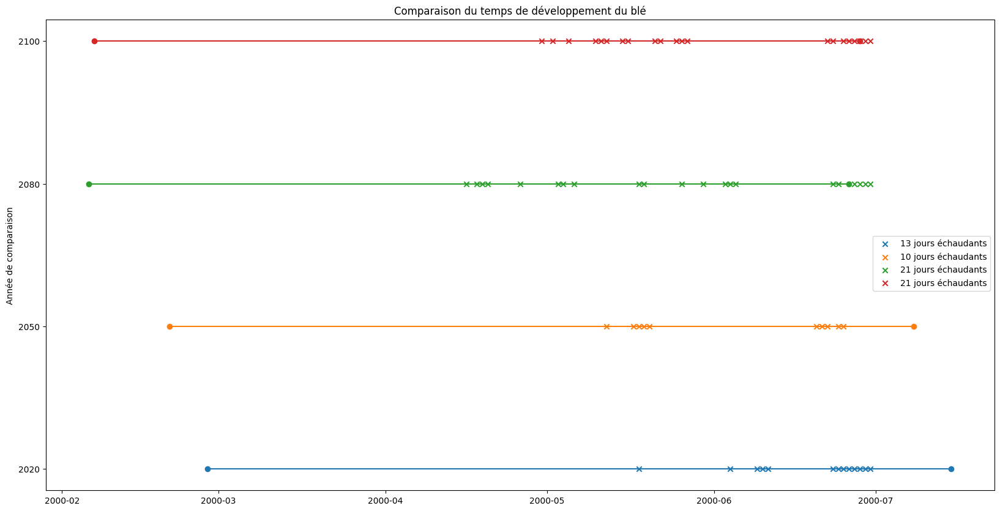

In [247]:
fig, ax = plt.subplots(1,1,figsize=(20, 10), sharex=True)
ax.plot([date_reprise_vegetation[0],date_recolte_ble[0]],[1,1],  marker="o")
ax.plot([date_reprise_vegetation[1],date_recolte_ble[1]],[2,2],  marker="o")
ax.plot([date_reprise_vegetation[2],date_recolte_ble[2]],[3,3],  marker="o")
ax.plot([date_reprise_vegetation[3],date_recolte_ble[3]],[4,4],  marker="o")
legend_jours_echaudants_2020 = ax.scatter(data_jour_echaudant_2020, np.ones(len(data_jour_echaudant_2020)), marker="x")
legend_jours_echaudants_2050 =ax.scatter(data_jour_echaudant_2050, np.full(len(data_jour_echaudant_2050), 2), marker="x")
legend_jours_echaudants_2080 =ax.scatter(data_jour_echaudant_2080, np.full(len(data_jour_echaudant_2080), 3), marker="x")
legend_jours_echaudants_2100 =ax.scatter(data_jour_echaudant_2100, np.full(len(data_jour_echaudant_2100), 4), marker="x")

ax.set_yticks([1, 2, 3, 4])
ax.set_yticklabels(["2020", "2050", "2080", "2100"])
ax.set_title("Comparaison du temps de développement du blé")

ax.legend([legend_jours_echaudants_2020,legend_jours_echaudants_2050, legend_jours_echaudants_2080, legend_jours_echaudants_2100], 
[f'{len(data_jour_echaudant_2020)} jours échaudants', f'{len(data_jour_echaudant_2050)} jours échaudants',f'{len(data_jour_echaudant_2080)} jours échaudants',f'{len(data_jour_echaudant_2100)} jours échaudants'], 
loc='best',bbox_to_anchor=(0.5, 0.05, 0.5, 0.5))
plt.ylabel("Année de comparaison")